# **Covid-Effects-on-Employment**
Both these datasets have been downloaded from https://data.ontario.ca/. With the help of data visulization we will try to conclude the effects of Covid19 to the Ontario public job market.

Name: Harshul Mehta

Name: Krupa Patel


## **Introduction**

#### In this notebook we analyzed two data sets to help us answer the question:
### **`How the increase in COVID-19 cases from 2019 to 2020 has impacted the Ontario public employment sector. `**

**1. Labour force characteristics by occupation (Canada)**

The first dataset "Employment_CAN" explores information on employment by occupation of workers for Canada. We condensed this data set to remove variables that were not important to our analysis and variables that had over 50% NaN values.We were left with 7 variables and 4221360 rows. The variables used are listed below:

*   REF_DATE(Qualitative): The month and year when the count was conducted  
*   GEO(Qualitative): The geographical area 
*   Labour force characteristics(Qualitative): unemployment rate, employment count 
*   National Occupational Classification (NOC)(Qualitative): All occupation categories 
*   Sex(Qualitative): Male, Female, Both
*   VALUE(Quantitative): percent or count of labour force characteristics

URL: https://open.canada.ca/data/en/dataset/978c7f6a-9ef7-4c90-b890-0ceea4dcd68d

**2. Covid cases in Ontario**

The second data set "Confirmed_positive_cases_covid" is complied daily reported data from public health units on confirmed positive cases of COVID-19 in Ontario. This dataset had 13 variables and 333690 rows. The variables used are listed below: 

Specimen_Date	Age_Group	Client_Gender	Case_AcquisitionInfo	Outcome1	Reporting_PHU	Reporting_PHU_Address	Reporting_PHU_City	Reporting_PHU_Postal_Code

* Accurate_Episode_Date: is the date that the case was reported
* Age_Group(Qualitative): age group of the victim
* CClient_Gender(Qualitative): the victim's gender
* Case_AcquisitionInfo(Qualitative): information on how the victim was affected
* Outcome1: recovery status
* Reporting_PHU: public health unit name
* Reporting_PHU_Address: location of the public health unit
* Reporting_PHU_City: the city in which it was reported
* Reporting_PHU_Postal_Code: Postal code of the public health unit

URL: https://data.ontario.ca/dataset/f4112442-bdc8-45d2-be3c-12efae72fb27/resource/455fd63b-603d-4608-8216-7d8647f43350/download/conposcovidloc.csv

In [3]:
#import all packages needed
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import plotly.graph_objects as go
import plotly.io as pio 
import plotly.express as px
import geopandas
from datetime import datetime
import pandas_bokeh
pandas_bokeh.output_notebook()
# !pip install --upgrade geopandas
# !pip install --upgrade pandas_bokeh

In [4]:
#import dataframe
df_EMP_CAN = pd.read_csv('Employment_CAN.csv')
#drop the extra columns of infromation
df_EMP_CAN = df_EMP_CAN.drop(columns=['DGUID', 'UOM_ID','SCALAR_FACTOR','SCALAR_ID','VECTOR','COORDINATE','STATUS',	'SYMBOL'	,'TERMINATED',	'DECIMALS'],axis=1)
df_EMP_CAN

,REF_DATE,GEO,Labour force characteristics,National Occupational Classification (NOC),Sex,UOM,VALUE
0,1987-01,Canada,Labour force,"Total, all occupations",Both sexes,Persons,13076.8
1,1987-01,Canada,Labour force,"Total, all occupations",Males,Persons,7432.5
2,1987-01,Canada,Labour force,"Total, all occupations",Females,Persons,5644.3
3,1987-01,Canada,Labour force,Management occupations [0],Both sexes,Persons,1311.9
4,1987-01,Canada,Labour force,Management occupations [0],Males,Persons,953.2
...,...,...,...,...,...,...,...
4221355,2021-02,British Columbia,Unemployment rate,"Labourers in processing, manufacturing and uti...",Males,Percentage,NaN
4221356,2021-02,British Columbia,Unemployment rate,"Labourers in processing, manufacturing and uti...",Females,Percentage,NaN
4221357,2021-02,British Columbia,Unemployment rate,Unclassified occupations,Both sexes,Percentage,NaN
4221358,2021-02,British Columbia,Unemployment rate,Unclassified occupations,Males,Percentage,NaN


In [5]:
#import dataframe
df_4 = pd.read_csv('Confirmed_positive_cases_covid.csv')
#remove the extra columns of information
df = df_4[['Row_ID','Accurate_Episode_Date', 'Case_Reported_Date','Test_Reported_Date','Specimen_Date','Age_Group','Client_Gender','Case_AcquisitionInfo','Outcome1','Reporting_PHU','Reporting_PHU_Address','Reporting_PHU_City','Reporting_PHU_Postal_Code']]
df

,Row_ID,Accurate_Episode_Date,Case_Reported_Date,Test_Reported_Date,Specimen_Date,Age_Group,Client_Gender,Case_AcquisitionInfo,Outcome1,Reporting_PHU,Reporting_PHU_Address,Reporting_PHU_City,Reporting_PHU_Postal_Code
0,1,2020-04-10,2020-04-17,2020-04-17,2020-04-15,40s,MALE,NO KNOWN EPI LINK,Resolved,Peel Public Health,7120 Hurontario Street,Mississauga,L5W 1N4
1,2,2020-05-22,2020-05-24,2020-05-24,2020-05-23,40s,MALE,NO KNOWN EPI LINK,Resolved,Peel Public Health,7120 Hurontario Street,Mississauga,L5W 1N4
2,3,2020-05-24,2020-05-29,2020-05-29,2020-05-28,20s,FEMALE,CC,Resolved,Peel Public Health,7120 Hurontario Street,Mississauga,L5W 1N4
3,4,2020-04-09,2020-04-11,2020-04-11,2020-04-09,60s,MALE,NO KNOWN EPI LINK,Fatal,Peel Public Health,7120 Hurontario Street,Mississauga,L5W 1N4
4,5,2020-04-06,2020-04-11,2020-04-11,2020-04-09,50s,FEMALE,NO KNOWN EPI LINK,Resolved,Peel Public Health,7120 Hurontario Street,Mississauga,L5W 1N4
...,...,...,...,...,...,...,...,...,...,...,...,...,...
333685,333686,2020-10-30,2020-10-31,2020-10-31,2020-10-30,<20,FEMALE,CC,Resolved,York Region Public Health Services,17250 Yonge Street,Newmarket,L3Y 6Z1
333686,333687,2020-06-04,2020-06-07,2020-06-07,2020-06-05,20s,MALE,NO KNOWN EPI LINK,Resolved,Toronto Public Health,"277 Victoria Street, 5th Floor",Toronto,M5B 1W2
333687,333688,2021-01-10,2021-01-19,2021-01-19,2021-01-18,30s,MALE,CC,Resolved,Niagara Region Public Health Department,1815 Sir Isaac Brock Way,Thorold,L2V 4T7
333688,333689,2020-12-06,2020-12-11,2020-12-11,2020-12-09,<20,FEMALE,CC,Resolved,Peel Public Health,7120 Hurontario Street,Mississauga,L5W 1N4


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



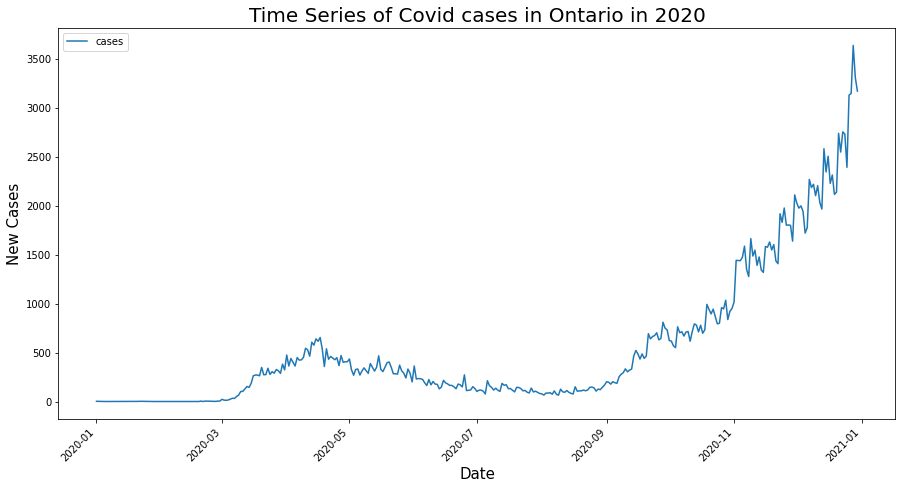

In [6]:
#import data from the original dataframe
df = df_4
#we isolate the time period of the pandemic
df['Accurate_Episode_Date'] = pd.to_datetime(df['Accurate_Episode_Date'])
df_tmp = df[(df['Accurate_Episode_Date'] >= datetime(2019,12,31))&(df['Accurate_Episode_Date'] < datetime(2020,12,31))]
#covert the date from the datetime format to string format
df_tmp['Accurate_Episode_Date']=df_tmp['Accurate_Episode_Date'].dt.strftime('%Y-%m-%d')
#create a dictionary of all the dates in the dataset
data = {}
data = dict.fromkeys(df_tmp['Accurate_Episode_Date'].unique(),0)
#increment for every case accounted for each day
for val in df_tmp['Accurate_Episode_Date']:
    data[val]+=1
#convert dictionary to dataframe
df_cov19 = pd.DataFrame({'Date':df_tmp['Accurate_Episode_Date'].unique(), 'cases':list(data.values()) })
#convert date to datetime format so we can sort the dates in order for timeseries
df_cov19['Date'] = pd.to_datetime(df_cov19['Date'])
df_cov19.sort_values(by='Date')
#plot the time series graph
plt = df_cov19.plot(x="Date",y="cases",rot = 45, figsize=(15,8))
plt.set_xlabel("Date",size=15)
plt.set_ylabel("New Cases",size=15)
plt.set_title("Time Series of Covid cases in Ontario in 2020",size=20)
plt

The above time series graph of Covid cases in Ontario though 2020 indicates that the first spike of covid cases in Ontario were reported in March. We can also see a decreasing pattern from July to September, the cases reported were below 500. This can be because of lockdowns being placed throughout Ontario in effort to decrease and mantain the Covid outbreak. But looking at the graph the second wave seems to have hit Ontario in October as the cases reported daily are greater than 500. By looking at the series graph we want to project that as the cases of covid-19 increase starting March 2020 that the employment rates in Ontario will drop. 

In [7]:
#Supress the 'SettingWithCopyWarning' which is thrown when changing values in the DataFrame
pd.options.mode.chained_assignment = None
#We only need three columns for the prallel graph
fig1 = df[['Age_Group','Client_Gender','Outcome1']]
#Drop all rows which have unknown age they won't be benifical for the analysis (Noise Data)
fig1 = fig1.drop(fig1[fig1.Age_Group == 'UNKNOWN'].index)
#Replace 'Gender Diverse' with 'Unspecified'
fig1['Client_Gender'] = df['Client_Gender'].replace(['GENDER DIVERSE'],'UNSPECIFIED')
#Rename the columns appropriately
fig1 = fig1.rename(columns = {'Outcome1':'Outcome'})
fig1 = fig1.rename(columns = {'Client_Gender':'Gender'})
fig1 = fig1.rename(columns = {'Age_Group':'Age Group'})
#Plot the graph and display it
px.parallel_categories(fig1).show()


The above parallel graph examines the relationship between age groups of reported covid cases to their gender and their status of outcome whether it's resolved or not or fatal. The graph shows that most Covid cases reported are from people that are 30 and up. Which is a majority of the working age. We can also see that between the three genders, females have a slightly higher count than males and unspecified. So we can conclude that more females have tested positive in Ontario. However, over 90% of these cases have the outcome of resolved. We also see that the cases that are not resolved are not gender-specific, but age-specific we see more people 50 and over having more unresolved cases.

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



Text(0.5, 1.0, 'Unemployment Rate between Males and Females in 2020')

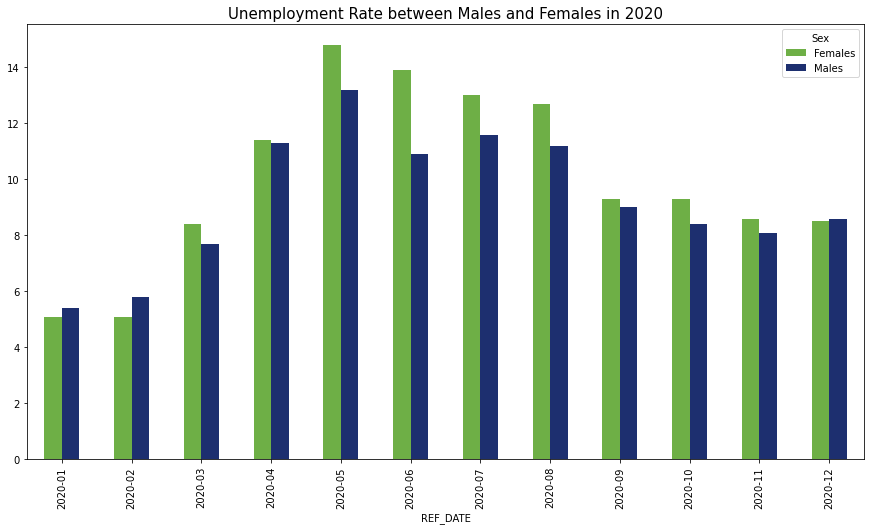

In [8]:
import matplotlib.pyplot as plt
#Extract Ontario province data for the year of 2020
df_EMP_ONT_2020 = df_EMP_CAN.loc[df_EMP_CAN['REF_DATE'].str.contains('2020')][df_EMP_CAN['GEO'].str.contains('Ontario')]
#Compare the total unemployment numbers in the dataset for each month of 2020 for both genders
df_UER = df_EMP_ONT_2020.loc[df_EMP_ONT_2020["Labour force characteristics"]== "Unemployment rate"] 
df_UER = df_UER.loc[df_UER["National Occupational Classification (NOC)"]== "Total, all occupations"]
df_UER = df_UER.loc[df_UER["Sex"]!= "Both sexes"]
#Reshape the data set
df_UER_1 = df_UER.pivot(index='REF_DATE', columns='Sex', values='VALUE')
#plot the data into a bar graph
df_UER_1.plot(kind = "bar",figsize=(15,8),color =("#6EAF46",'#1D2F6F'))
plt.title("Unemployment Rate between Males and Females in 2020", fontsize = 15)

The unemployment rate in females is slightly higher than males in 2020. As seen in the parallel graph this can be concluded because more females tested positive in 2020. We can also see that the unemployment rate has increased starting March which was the first spike in covid cases in Ontario. It becomes evident that the unemployment rate has increased almost more than double as the covid cases in Ontario increased. 


Text(0.5, 1.0, 'Covid Cases (Ontario)')

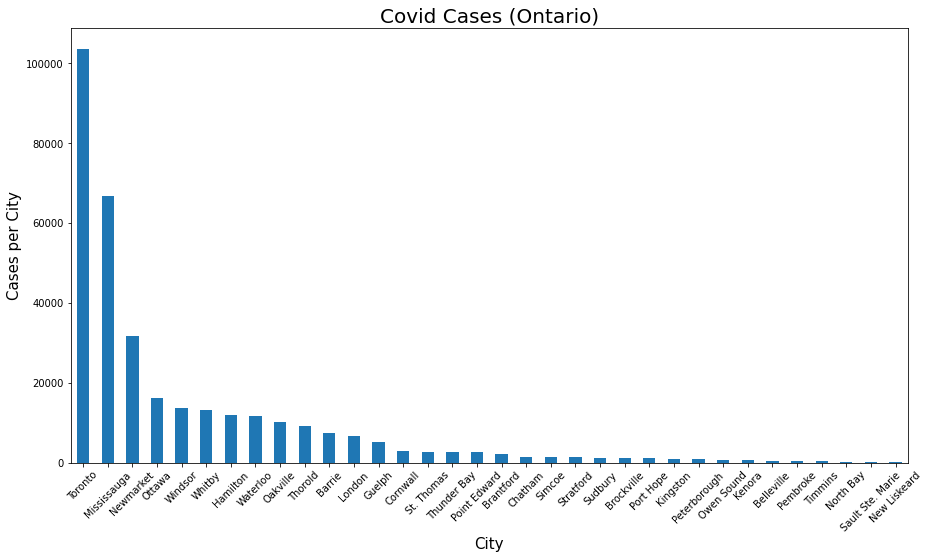

In [9]:
#count the number of time each city is used in the dataframe, then we sort the counts in 
#descending order and plot it in a bar graph
df = df_4['Reporting_PHU_City'].value_counts().sort_values(ascending=False).plot.bar(figsize=(15,8), rot=45)
#name the axis and the title of the graph
df.set_xlabel("City",fontsize=15)
df.set_ylabel("Cases per City",fontsize=15)
df.set_title("Covid Cases (Ontario)", fontsize=20)

In [10]:
#refer to the dataframe 
df = df_4
canada = geopandas.read_file("gfsa000b11a_e.shp")
ontario = canada[canada['PRUID'] == '35']
#CFSAUID - Census Forward sortation area unique identifier, it is the first 3 characters of an
#area pin code. I've used it to create a relationship between the shafefile data of Ontario
#and the reported covid hospitalizations of Ontario

#Save unique CFSAUID in a dictionary
pin = {}
pin = dict.fromkeys(ontario['CFSAUID'].unique(),0)
#Select the dateline we need for the analysis
df['Accurate_Episode_Date'] = pd.to_datetime(df['Accurate_Episode_Date'])
df_tmp = df[(df['Accurate_Episode_Date'] >= datetime(2019,1,1))&(df['Accurate_Episode_Date'] < datetime(2020,12,1))]
#Count the reported cases per hospital of every region.
for index, row in df_tmp.iterrows():
    pin[row['Reporting_PHU_Postal_Code'][:3]]+=1
#Convert the dictionary into a dataframe
df_pin = pd.DataFrame({'PCODE': ontario['CFSAUID'].unique(), 'cases':list(pin.values()) })
#omit the regions with zero reported cases (noise)
df_pin = df_pin[(df_pin['cases']>0)]
#left join our calculations with the Ontario map
new_df=ontario.join(df_pin.set_index('PCODE'), on='CFSAUID')
#create a heat plot on the map
new_df.plot_bokeh(simplify_shapes=20000,
                  category="cases", 
                  colormap="Spectral", 
                  hovertool_columns=["CFSAUID","cases"])

Figure(id='1002', ...)

By looking at the graph the highest cities with Covid-19 cases are Toronto and Mississauga with more than 60000 reported cases throughout 2020. They are also the most populated cities in Ontario holding a high job market. 

In [11]:
#Extract total employment numbers from the data set for Jan 2020 & Dec 2020
df_LFC = df_EMP_ONT_2020.loc[df_EMP_ONT_2020["Labour force characteristics"]== "Employment"] 
df_LFC = df_LFC.loc[df_LFC["National Occupational Classification (NOC)"]!= "Total, all occupations"]
df_LFC  = df_LFC.loc[df_LFC["Sex"]== "Both sexes"]
df_LFC = df_LFC.loc[df_LFC['REF_DATE'].str.contains('2020-01|2020-12')]


Text(0.5, 1.0, 'Total Occupation count difference from Jan 2020 and Dec 2020')

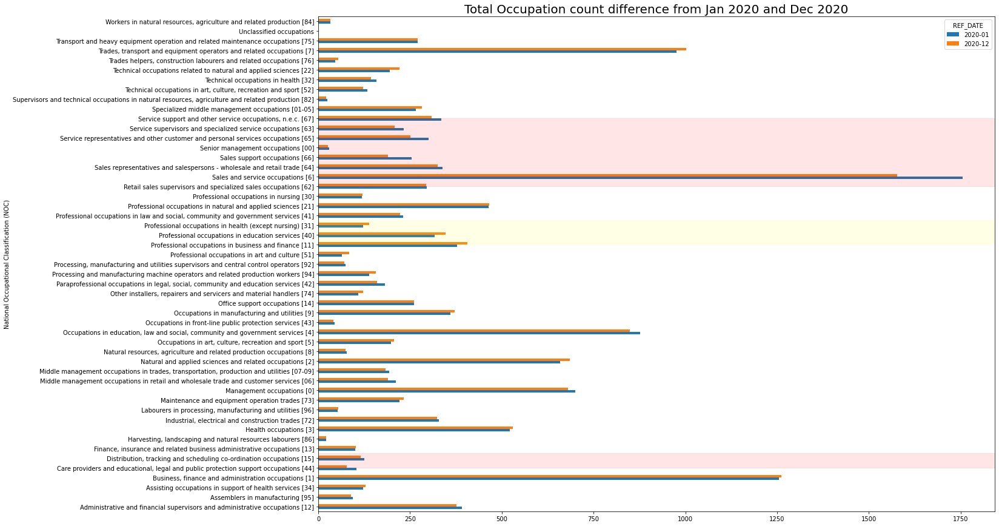

In [12]:
#Reshape the dataset
pl = df_LFC.pivot(index='National Occupational Classification (NOC)', columns='REF_DATE', values='VALUE')
#plot the graph
pl.plot.barh(figsize=(20,15))
plt.axhspan(4,5.5, color='red', alpha=0.1)
plt.axhspan(33,40, color='red', alpha=0.1)
plt.axhspan(27,29.5, color='yellow', alpha=0.1)
plt.title("Total Occupation count difference from Jan 2020 and Dec 2020", fontsize = 20)

The above graph displays categories of different occupations in Ontario, it compares the employment in the different sectors in January of 2020 vs December. The red shaded area highlights where employment in January was higher than in December. Occupations such as sales, service supports, and retail, care providers have experienced a decrease in numbers by the end of 2020. This can be due to the enforcement of the lockdown which limited in-person contact. 

The portion highlighted in yellow indicates where there has been an increase in employment for December of 2020 during the peak of Covid. That would include educational services and occupations in health. As schools in Ontario continued to provide in-person and virtual teaching, and hospitals continued to receive high volumes of covid-patients these occupations had an increase in employment. 

All in all, we can see that from Jan to Dec most occupations have lost employment.

Text(0.5, 1.0, 'Proportion of employment in January, May, and December of 2020')

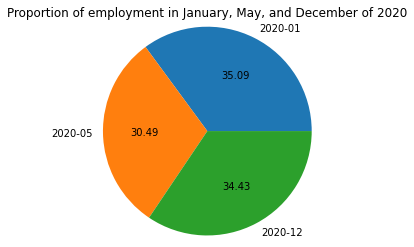

In [13]:
#Take out the Ontario employment numbers for all occupations for Jan, May and Dec 2020
df_LFC_CAN = df_EMP_CAN.loc[df_EMP_CAN["Labour force characteristics"]== "Employment"] 
df_LFC_ONT = df_LFC_CAN.loc[df_LFC_CAN["GEO"]== "Ontario"] 
df_LFC_ONT = df_LFC_ONT.loc[df_LFC_ONT["National Occupational Classification (NOC)"]== "Total, all occupations"]
df_LFC_ONT = df_LFC_ONT.loc[df_LFC_ONT['REF_DATE'].str.contains('2020-01|2020-05|2020-12')]
df_LFC_ONT  = df_LFC_ONT.loc[df_LFC_ONT["Sex"]== "Both sexes"]
#Plot a pie chart to visualize the data
plt.pie(df_LFC_ONT["VALUE"], labels = df_LFC_ONT["REF_DATE"],autopct='%.2f', radius = 1.2)
#Add a title to the plot
plt.title("Proportion of employment in January, May, and December of 2020")

The above piechart indicates that from January to May there has been almost a 4% decrease in employment. In December we can see that the employment rate is recovering this can be the result of restrictions lifting across the province. Referring back to the time-series graph, it indicated high cases of more than 500 daily reported were in May which we can see from the piechart that had an effect on the decreasing employment rates in Ontario.  


## **Conclusion**

The above piechart indicates that from January to May there has been almost a 4% decrease in employment. In December we can see that the employment rate is recovering this can be the result In conclusion, from our analysis we've found that as the covid outbreak increased in Ontario it has shown significant fluctuations in the provinces labour market as a result of public health measures. 

As predicted Ontario has experienced a rise in unemployment rates starting March 2020 during the time of Ontario's initial pandemic lockdown. This affected workers in all age groups, all occupations and major cities. We found that female workers experienced a larger loss in employment compared to male and unspecified combined. We found that the reason for that was because most of 2020 female reported covid cases were higher than of male. In 2020 we noticed that nearly all occupations experienced job loss due to the ongoing pandemic related shutdowns. We saw that the most affected occupation were the ones with close customer contact. Lastly, we noticed that the most affected age groups of covid were from the working-age 25+. This age group makes a majority of the working class, which is one of the reasons employment rates are affected.  Thus,  the pandemic has intensified the challenges faced by the people in Ontario and that has resulted in disruptions in the labour market.
of restrictions lifting across the province. Referring back to the time-series graph, it indicated high cases of more than 500 daily reported were in May which we can see from the piechart that had an effect on the decreasing employment rates in Ontario.  
